# Image Segmentation

В этом задании вы будете решать задачу сегментации людей на фотографии с помощью нейросетевых архитектур Unet и Linknet. 

Ссылка на данные: https://yadi.sk/d/-ug82uwhSuLYrA

## Загрузка данных (1 балл)

Для загрузки данных pytorch опирается на такую сущность, как **`Dataset`**.

Этот абстрактный класс определен в `torch.utils.data.dataset`:

```python
class Dataset(object):
    """An abstract class representing a Dataset.

    All other datasets should subclass it. All subclasses should override
    ``__len__``, that provides the size of the dataset, and ``__getitem__``,
    supporting integer indexing in range from 0 to len(self) exclusive.
    """

    def __getitem__(self, index):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __add__(self, other):
        return ConcatDataset([self, other])
```
При определении нового источника данных мы создаем наследника данного класса и реализуем методы `__getitem__` и `__len__`.

Пример готового такого класса — `torchvision.datasets.ImageFolder`, который позволяет создать датасет на основе директории с imagenet-подобной структурой поддиректорий (`./train/{class}` и `./val/{class}`):

```python
imagenet = torchvision.datasets.ImageFolder('path/to/imagenet_root/')
```

Реализуйте класс PhotosDataset для выданных данных.

**Внимание.** Возможно, стоит прочитать следующий пункт задания, чтобы реализация была удобной.

In [1]:
import torch
import torch.nn as nn

import numpy as np
import numpy.testing as npt
import matplotlib.pyplot as plt

from torchvision.models import vgg13
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

import os
import itertools
import functools
import numpy as np
from PIL import Image, ImageEnhance
from matplotlib import pyplot as plt
from tqdm import tqdm

%matplotlib inline

In [2]:
class PhotosDataset(Dataset):
    def __init__(self, images_dir, target_dir=None, transforms=None):
        """
        Arguments
        ---------
        images_dir : str
            Path to directory with images
            
        target_dir : str
            Path to directory with masks.
            Each mask corresponds to one image.
            Corresponding mask and image have the same name, but different format.
            
        transforms : some collection
            Sequence of transformations for images and masks. 
        """
        super(PhotosDataset, self).__init__()
        self.transforms = transforms
        self.images_dir = images_dir
        self.target_dir = target_dir
        _, _, self.images_filenames = next(os.walk(self.images_dir))
        self.images_filenames = sorted(self.images_filenames,
                                       key=lambda x: int(x.split('.')[0]))
        _, _, self.target_filenames = next(os.walk(self.target_dir))
        self.target_filenames = sorted(self.target_filenames,
                                       key=lambda x: int(x.split('.')[0]))

    def __len__(self):
        return len(self.images_filenames)
                   
    def __getitem__(self, idx):
        """
        Arguments
        ---------
        idx : int
            Index of image and mask
        
        Returns
        -------
        (image, mask)
        """
        image = Image.open(f'{self.images_dir}/{self.images_filenames[idx]}')
        mask = Image.open(f'{self.target_dir}/{self.target_filenames[idx]}')
        for transform in self.transforms:
            image, mask = transform(image, mask)
        return image, mask
    

## Модуль аугментации (3 балла)

Конструктор стандартного `ImageFolder`, принимают параметр `transform` (и иногда `target_transform`).

Они служат для того, чтобы загружаемые изображения (обычно это `PIL.Image`) или таргеты преобразовывать в тензоры нужного вида.

В `torchvision` входит модуль `transforms` для стандартных примеров таких преобразований. В `transforms` могут содержаться случайные преобразования, это самый простой путь для реализации аугментации данных.

При определении кастомного трансформера помимо конструктора нужно реализовать лишь метод `__call__`:

```python
class HorizontalFlip(object):
    def __init__(self, mode=0):
        self.method = mode

    def __call__(self, img):
        """
        Args:
            img (PIL.Image): Image to be flipped.

        Returns:
            PIL.Image: Randomly flipped image.
        """
        if self.method:
            return img.transpose(Image.FLIP_LEFT_RIGHT)
        return img

```

С полным списком стандартных преобразований можно ознакомиться в http://pytorch.org/docs/master/torchvision/transforms.html.

В данной части вам предлагается самостояльно реализовать несколько кастомных трансформеров.
Обратите внимание, что для некоторых трансформеров, необходимо преобразовывать и изображение, и маску, а для каких-то только изображение.

Один из путей реализации:
* реализовать декоратор, делающий любое преобразование случайным
* реализовать декоратор, применяющий преобразование и к изображению, и к маске

Список трансформеров, которые надо реализовать:

* случайное (с вероятностью p) горизонтальное отображение (flip) изображения 
* случайное (с веротностью p) вырезание фрагмента изображения (заданного или случайного размера)
* случайное (с вероятностью p) изменение яркости изображения (на заданную или случайную величину)
* случайное (с веротностью p) изменение фона изображения (на изображение из заданного списка изображений)

Добавьте случайные преобразования в ваши датасеты. Также, добавьте преобразование в tensor и нормализацию для изображения:

```
transforms.ToTensor()
transforms.Normalize(mean=[0.485, 0.456, 0.406],
                     std=[0.229, 0.224, 0.225])
```

In [3]:
def probabilistic(transformer):
    def wrapper(self, image, mask):
        if np.random.binomial(1, self.p):
            return transformer(self, image, mask)
        return image, mask
    return wrapper

def apply_for_both(transform):
    def wrapper(self, image, mask):
        mask = transform(self, mask)
        image = transform(self, image)
        return image, mask
    return wrapper

def apply_for_one(transform):
    def wrapper(self, image, mask):
        image = transform(self, image)
        return image, mask
    return wrapper


In [4]:


class HorizontalFlip:
    def __init__(self, p=0.4):
        self.p = p

    @probabilistic
    @apply_for_both
    def __call__(self, img):
        return img.transpose(Image.FLIP_LEFT_RIGHT)


class Crop:
    def __init__(self, size=None, upper_left=None, pad_if_needed=False, fill=0, p=0.4):
        self.p = p
        self.pad_if_needed = pad_if_needed
        self.fill = fill
        if size is None:
            self.size = None
            self.no_size = True
        elif isinstance(size, int) or len(size) == 1:
            self.w = size
            self.h = size
        else:
            self.w, self.h = size
        if upper_left is None:
            self.x0 = None
            self.y0 = None
            self.no_point = True
        else:
            self.x0, self.y0 = lower_left
            self.np_point = False
        self.size_processed = False
        self.point_processed = False

    @probabilistic
    @apply_for_both
    def __call__(self, img):
        if self.no_size and not self.size_processed:
            min_size = min(img.size[0], img.size[1])
            max_size = max(img.size[0], img.size[1])
            size = np.random.randint(min_size//2, max_size//2)
            self.h = size
            self.w = size
        if self.no_point and not self.point_processed:
            self.x0 = np.random.randint(img.size[0]-self.w)
            self.y0 = np.random.randint(img.size[1]-self.h)
        cropped = img.crop((self.x0, self.y0, self.x0+self.w, self.y0+self.h))
        if self.no_size:
            self.size_processed = ~self.size_processed
        if self.no_point:
            self.point_processed = ~self.point_processed
        if not self.pad_if_needed:
            return cropped
        new_img = np.full_like(img, self.fill)
        new_img[self.y0 : self.y0+self.h, self.x0 : self.x0+self.w] = np.asarray(cropped)
        return Image.fromarray(new_img)


class ChangeBrightness:
    def __init__(self, step=None, max_step=96, p=0.4):
        self.p = p
        self.step = step
        self.max_step = max_step
        self.no_step = True if step is None else False

    @probabilistic
    @apply_for_one
    def __call__(self, img):
        if self.no_step:
            self.step = np.random.randint(-self.max_step, self.max_step)
        new_img = np.asarray(img, dtype=int) + self.step
        new_img[new_img > 255] = 255
        new_img[new_img < 0] = 0
        return Image.fromarray(new_img.astype(np.uint8))

    
class ChangeBackground:
    def __init__(self, p=0.4):
        self.p = p
        self.images_dir = './people_data/background'
        _, _, self.images_filenames = next(os.walk(self.images_dir))
        self.background_filenames = sorted(self.images_filenames,
                                           key=lambda x: int(x.split('.')[0]))
        self.size = len(self.background_filenames)
        self.mask = None
    
    @probabilistic
    @apply_for_both
    def __call__(self, img):
        if self.mask is None:
            self.mask = img
            return img
        idx = np.random.randint(self.size)
        back = Image.open(f'{self.images_dir}/{self.background_filenames[idx]}')
        mask = self.mask
        self.mask = None
        return Image.composite(img, back, mask)


class ToTensor:
    def __init__(self):
        self.to_tensor = transforms.ToTensor()

    @apply_for_both
    def __call__(self, img):
        return self.to_tensor(img)

    
class Normalize:
    def __init__(self, mean, std):
        self.normalize = transforms.Normalize(mean, std)

    @apply_for_one
    def __call__(self, img):
        return self.normalize(img)
        

In [5]:
DATA_PATH = 'people_data/'

train_dataset = PhotosDataset(
    images_dir=DATA_PATH + 'train/',
    target_dir=DATA_PATH + 'train_mask/',
    transforms=[HorizontalFlip(),
                ChangeBackground(),
                ChangeBrightness(),
                Crop(pad_if_needed=True),
                ToTensor(),
                Normalize(mean=[0.485, 0.456, 0.406],
                          std=[0.229, 0.224, 0.225])]
)

test_dataset = PhotosDataset(
    images_dir=DATA_PATH + 'test/',
    target_dir=DATA_PATH + 'test_mask/',
    transforms=[ToTensor(),
                Normalize(mean=[0.485, 0.456, 0.406],
                          std=[0.229, 0.224, 0.225])]
)

Функция для отображения изображения:

In [6]:
def show_idx_image(dataset, idx):
    mask_img = dataset[idx]

    image_to_show = mask_img[0].transpose(0, 1).transpose(1, 2).numpy()
    image_to_show = (image_to_show * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    image_to_show = np.clip(image_to_show, 0, 1)

    mask_to_show = mask_img[1][0].numpy()

    fig, ax = plt.subplots(1, 3)
    fig.set_figwidth(7)
    fig.set_figheight(3)


    plt.subplot(1, 2, 1)
    plt.imshow(image_to_show)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask_to_show)
    plt.axis('off')

Отобразите несколько изображений и масок, на которых будет видна правильная работа вашего модуля аугментации данных.

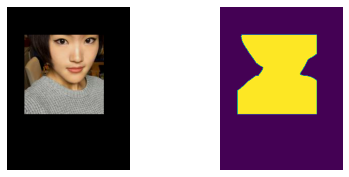

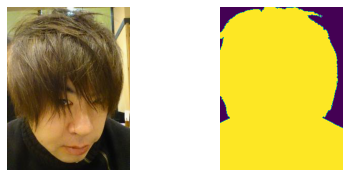

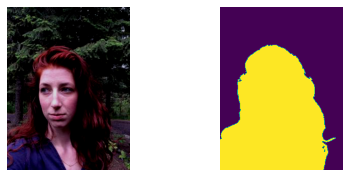

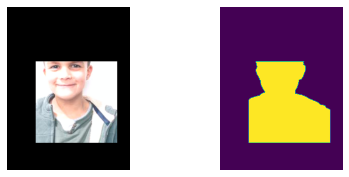

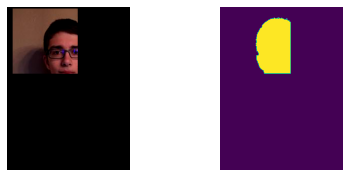

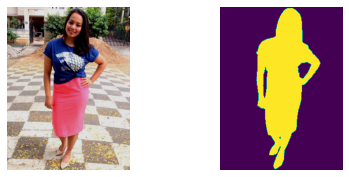

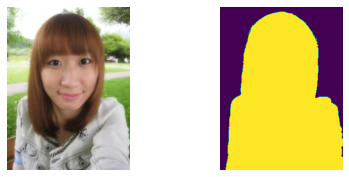

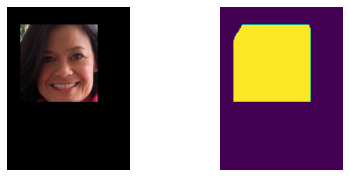

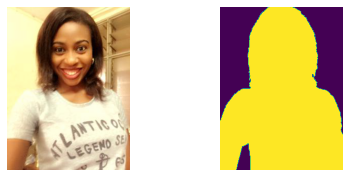

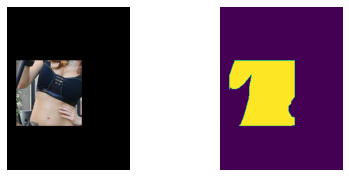

In [7]:
for i in np.random.randint(len(train_dataset), size=10):
    show_idx_image(train_dataset, i)

In [8]:
def show_transforms(image, mask, transformer):
    fig, ax = plt.subplots(1, 4)
    fig.set_figwidth(7)
    fig.set_figheight(3)

    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(mask)
    plt.axis('off')

    image_, mask_ = transformer(image, mask)

    plt.subplot(1, 4, 3)
    plt.imshow(image_)
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(mask_)
    plt.axis('off')


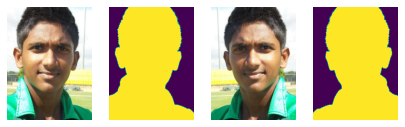

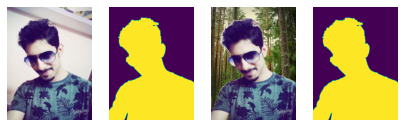

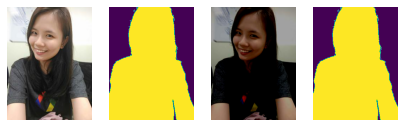

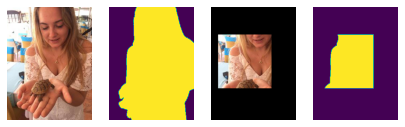

In [9]:
for transformer in [HorizontalFlip(p=1),
                    ChangeBackground(p=1),
                    ChangeBrightness(p=1),
                    Crop(pad_if_needed=True, p=1)]:
    idx = np.random.randint(len(train_dataset))
    image = Image.open(f'{DATA_PATH}/train/{idx}.jpg')
    mask = Image.open(f'{DATA_PATH}/train_mask/{idx}.png')
    show_transforms(image, mask, transformer)


## Загрузчики

При обучении сети удобнее работать не с датасетами, а с загрузчиками. Загрузчики создаются на основе датасета и позволяют итерироваться по батчам из него.

Обратите внимание на параметры DataLoader. При num_workers > 1, батчи готовятся (загружаются картинки, обрабатываются и т.д.) сразу в нескольких фоновых процессах. С помощью параметра shuffle можно подавать картинки на обучение в случайном порядке.

In [10]:
train_data_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=0)
test_data_loader = DataLoader(test_dataset, batch_size=8, num_workers=0)

## DiceLoss (1 балл)

Функция потерь реализовывается как и все стандартные нейронные модули в pytorch, через nn.Module. В ячейке ниже вам предлагается реализовать фукцию потерь dice (аналог меры Джаккарда).

Результат dice loss определим как:

$$
1 - \frac{2\sum_{i, j}a_{ij}b_{ij}}{\sum_{ij}(a_{ij} + b_{ij} + \varepsilon)}
$$

где $a_{ij} \in [0, 1]$ — предсказанная вероятность нахождения человека в пикселе изображения, $b_{ij}$ — разметка для пикселя изображения.

In [11]:
class DiceLoss(nn.Module):
    def __init__(self, eps=1e-7, reduction=None, with_logits=True):
        """
        Arguments
        ---------
        eps : float
            eps in denominator
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:
            
            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of batches in the output
            'sum':  the output will be summed. 
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()
        self.eps = eps
        self.reduction = reduction
        self.with_logits = with_logits
        
    def forward(self, logits, true_labels):
        true_labels = true_labels.long()
        
        if self.with_logits:
            logits = torch.sigmoid(logits)
            
        batch_size = logits.size(0)
        nom = 2 * (logits * true_labels).view(batch_size, -1).sum(1)
        denom = (logits + true_labels + self.eps).view(batch_size, -1).sum(1)
        batch_loss = 1 - nom / denom
        if self.reduction == 'sum':
            loss_value = batch_loss.sum()
        elif self.reduction == 'mean':
            loss_value = batch_loss.mean()
        elif self.reduction is None:
            loss_value = batch_loss
            
        return loss_value

Проверка реализации:

In [12]:
logits = torch.tensor([
    [[0, 0.5], [0.5, 1]],
    [[0.1, 0.1], [0, 0]],
])

target = torch.tensor([
    [[0, 1], [1, 1]],
    [[1, 0], [0, 1]],
])

losses = DiceLoss(with_logits=False, reduction=None, eps=1e-7)(logits, target)
npt.assert_almost_equal(losses.numpy(), np.array([0.2, 0.90909]), decimal=4)

loss = DiceLoss(with_logits=False, reduction='mean', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 0.554545, decimal=4)

loss = DiceLoss(with_logits=False, reduction='sum', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 1.10909, decimal=4)

## IoU

https://www.kaggle.com/iezepov/fast-iou-scoring-metric-in-pytorch-and-numpy

In [13]:
def iou(outputs, labels, SMOOTH = 1e-6):
    outputs = outputs.squeeze(1)
    labels = labels.squeeze(1)
    
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10 # Frac < 0.5 -> no mercy, u lost it
                                                                    
    return thresholded  # Or thresholded.mean() if you are interested in average across the batch


## BCEWithLogitsLoss

Обернем для удобства подсчета ошибки на тесте.

In [14]:
class BCEWithLogitsLoss(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.test_loss = torch.nn.BCEWithLogitsLoss(reduction='none')

    def forward(self, outputs, labels):
        return self.test_loss(outputs, labels).view(labels.size(0), -1).mean(1)


## Unet (2 балла)

Для решения задачи сегментации будем использовать UNet (https://arxiv.org/pdf/1505.04597.pdf) с энкодером из первых блоков предобученного VGG13. Архитектура сети реализована за вас ниже.

Энкодер:

In [15]:
class VGG13Encoder(torch.nn.Module):
    def __init__(self, num_blocks, pretrained=True):
        super().__init__()
        self.num_blocks = num_blocks
        self.blocks = nn.ModuleList()
        # Obtaining pretrained VGG model from torchvision.models and
        # copying all layers except for max pooling.
        feature_extractor = vgg13(pretrained=pretrained).features
        for i in range(self.num_blocks):
            self.blocks.append(
                torch.nn.Sequential(*[feature_extractor[j]
                                      for j in range(i * 5, i * 5 + 4)]))

    def forward(self, x):
        activations = []
        for i in range(self.num_blocks):
            x = self.blocks[i](x)
            activations.append(x)
            if i != self.num_blocks - 1:
                x = torch.functional.F.max_pool2d(x, kernel_size=2, stride=2)
        return activations

Декодер:

In [16]:
class DecoderBlock(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()

        self.upconv = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv1 = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv2 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.relu = nn.ReLU()
    def forward(self, down, left):
        x = torch.nn.functional.interpolate(down, scale_factor=2)
        x = self.upconv(x)
        x = self.relu(self.conv1(torch.cat([left, x], 1)))
        x = self.relu(self.conv2(x))
        return x

In [17]:
class Decoder(nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        for i in range(num_blocks):
            self.add_module(f'block{num_blocks - i}', DecoderBlock(num_filters * 2**i))

    def forward(self, acts):
        up = acts[-1]
        for i, left in enumerate(acts[-2::-1]):
            up = self.__getattr__(f'block{i + 1}')(up, left)
        return up

Сеть Unet:

In [18]:
class UNet(torch.nn.Module):
    def __init__(self, num_classes=1, num_filters=64, num_blocks=4):
        super().__init__()
        self.encoder = VGG13Encoder(num_blocks=num_blocks)
        self.decoder = Decoder(num_filters=64, num_blocks=num_blocks-1)
        self.final = torch.nn.Conv2d(
            in_channels=num_filters, out_channels=num_classes, kernel_size=1
        )

    def forward(self, x):
        acts = self.encoder(x)
        x = self.decoder(acts)
        x = self.final(x)
        return x

Функция для оценивания качества сети:

In [19]:
def evaluate_net(net, testloader, criterion, val_criterion, device, size=len(test_dataset)):
    net = net.eval()

    loss = 0.
    correct = 0.
    
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
    
            outputs = net(images).to('cpu')
            
            loss += criterion(outputs, labels).detach().sum().item()
            correct += val_criterion((outputs > 0).int(), labels.int()).sum().item()
    
    mean_loss = loss / size
    metric = correct / size
    
    return mean_loss, metric

Теперь применим сеть на практике!

Обучите сеть на обучающей выборке и протестируйте качество на тестовой выборке. 

Сначала при обучении используйте только кросс-энтропию (torch.nn.BCEWithLogitsLoss будет более удобна для бинарного случая). Зафиксируйте результат.

Сравните между собой несколько стратегий оптимизации (только кросс-энтропия, только dice loss, сумма двух лоссов с весами). 

Для всех экспериментов отобразите графики функции потерь и качества за время обучения. Выведите получившиеся маски для нескольких изображений из датасета. Сделайте выводы.

__Важно!__

Будем считать ошибку на train, усредняя по батчам, а ошибку на test и качество будем измерять, усредняя по значениям для объектов.

Мотивация в том, что на обучении каждый раз нам не известно из-за перемешивания, что за объекты приходят к нам в батчах, поэтому нет смысла делать иначе как усредняя по батчам.

BCEWithLogitsLoss выдает ошибку для каждого пикселя, тогда ошибку для одной картинки определим как среднюю ошибку по всем пикселям (это и происходит в обертке над ***torch.nn.BCEWithLogitsLoss***, приведенной выше).

In [20]:
n_epochs = 5
lr = 1e-4
weight_decay = 1e-10
step_size = 4
gamma = 0.1

device=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [21]:
def train_net(net, optimizer, scheduler, criterion, path, trainloader=train_data_loader,
              testloader=test_data_loader, n_epochs=n_epochs, train_size=len(train_dataset), device=device):
    train_loss = []
    full_test_loss = []
    full_ious = []
    ious = []
    test_loss = []
    net = net.to(device)
    for epoch in tqdm(range(n_epochs)):
        net = net.train()
        losses = []
        for images, labels in trainloader:
            optimizer.zero_grad()
            images = images.to(device)
            outputs = net(images).to('cpu')
            loss = criterion(outputs, labels).mean()
            losses.append(loss.item())
            loss.backward()
            optimizer.step()
        scheduler.step()
        train_loss.append(np.mean(losses))
        loss_epoch, ious_ = eval_epoch(epoch, net, device, testloader, criterion)
        test_loss.append(loss_epoch)
        ious.append(ious_)
        print(f'\nLoss for Epoch {epoch+1}: train -> {np.mean(train_loss)}, test -> {loss_epoch}, iou -> {ious_}')
    torch.save(net, path)
    torch.cuda.empty_cache()
    return train_loss, test_loss, ious

def eval_epoch(epoch, net, device, testloader, critetion, size=len(test_dataset)):
    net = net.eval()
    net = net.to(device)
    loss_stat = 0.
    ious = 0.
    with torch.no_grad():
        for images, labels in testloader:
            images = images.to(device)
            outputs = net(images).to('cpu')
            loss_stat += critetion(outputs, labels).sum().item()
            ious += iou((outputs > 0).int(), labels.int()).sum().item()
    return loss_stat / size, ious / size
    

In [22]:
torch.cuda.is_available()

True

__UNet: BCE__

In [23]:
ce_model = UNet()
criterion = BCEWithLogitsLoss()
optimizer = torch.optim.Adam(ce_model.parameters(), lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=gamma)

In [24]:
ce_train_loss, ce_test_loss, ce_iou = train_net(ce_model, optimizer, scheduler, criterion, path='./ce_model')

 20%|████████████████▌                                                                  | 1/5 [03:48<15:14, 228.61s/it]


Loss for Epoch 1: train -> 0.24081622522610885, test -> 0.2246538223104274, iou -> 0.7730496555355424


 40%|█████████████████████████████████▏                                                 | 2/5 [07:35<11:24, 228.12s/it]


Loss for Epoch 2: train -> 0.20029261779899782, test -> 0.20056397103248758, iou -> 0.814184418806793


 60%|█████████████████████████████████████████████████▊                                 | 3/5 [11:23<07:35, 227.95s/it]


Loss for Epoch 3: train -> 0.17357005899738984, test -> 0.1702597919085347, iou -> 0.8439716481147929


 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [15:10<03:47, 227.65s/it]


Loss for Epoch 4: train -> 0.1576696512504266, test -> 0.16993652844259924, iou -> 0.838297891278639


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [18:57<00:00, 227.56s/it]


Loss for Epoch 5: train -> 0.14240982247263018, test -> 0.14587561078105413, iou -> 0.8666666889867038


In [25]:
%%time
evaluate_net(ce_model, test_data_loader, BCEWithLogitsLoss(), iou, device)

Wall time: 10.5 s


(0.14587561078105413, 0.8666666889867038)

__UNet: Dice__

In [26]:
d_model = UNet()
criterion = DiceLoss()
optimizer = torch.optim.Adam(d_model.parameters(), lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=gamma)

In [27]:
d_train_loss, d_test_loss, d_iou = train_net(d_model, optimizer, scheduler, criterion, path='./d_model')

 20%|████████████████▌                                                                  | 1/5 [03:48<15:12, 228.08s/it]


Loss for Epoch 1: train -> 0.16981557959459237, test -> 0.08896144019796494, iou -> 0.7397163167912909


 40%|█████████████████████████████████▏                                                 | 2/5 [07:35<11:24, 228.01s/it]


Loss for Epoch 2: train -> 0.12295731187373753, test -> 0.08421527324838841, iou -> 0.7517730631726853


 60%|█████████████████████████████████████████████████▊                                 | 3/5 [11:25<07:36, 228.40s/it]


Loss for Epoch 3: train -> 0.10397937860435401, test -> 0.08637625232655952, iou -> 0.7496454056273115


 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [15:20<03:50, 230.52s/it]


Loss for Epoch 4: train -> 0.0924046733747264, test -> 0.06326174736022949, iou -> 0.8234042647882556


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [19:11<00:00, 230.34s/it]


Loss for Epoch 5: train -> 0.08325354003915067, test -> 0.05503905157670907, iou -> 0.8482269733510119


In [28]:
%%time
evaluate_net(d_model, test_data_loader, DiceLoss(), iou, device)

Wall time: 10.4 s


(0.05503905157670907, 0.8482269733510119)

__UNet: 0.75 * BCE + 0.25 * Dice__

In [29]:
class SemiLoss(nn.Module):
    def __init__(self, a=0.75, b=0.25, **kwargs):
        super().__init__()
        a = np.abs(a)
        b = np.abs(b)
        self.a = a / (a + b)
        self.b = b / (a + b)
        self.l1 = BCEWithLogitsLoss()
        self.l2 = DiceLoss(**kwargs)

    def forward(self, logits, true_labels):
        loss_value = self.a * self.l1(logits, true_labels) + self.b * self.l2(logits, true_labels)
        return loss_value


In [30]:
semi_model = UNet()
criterion = SemiLoss()
optimizer = torch.optim.Adam(semi_model.parameters(), lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=gamma)

In [31]:
semi_train_loss, semi_test_loss, semi_iou = train_net(semi_model, optimizer, scheduler, criterion, path='./semi_model')

 20%|████████████████▌                                                                  | 1/5 [03:53<15:35, 233.89s/it]


Loss for Epoch 1: train -> 0.22939492096386013, test -> 0.20679886417186005, iou -> 0.7631205700813456


 40%|█████████████████████████████████▏                                                 | 2/5 [07:54<11:47, 235.97s/it]


Loss for Epoch 2: train -> 0.18154649713115228, test -> 0.17994526345679102, iou -> 0.7971631381528598


 60%|█████████████████████████████████████████████████▊                                 | 3/5 [11:49<07:50, 235.50s/it]


Loss for Epoch 3: train -> 0.1566877086413565, test -> 0.1439646288012782, iou -> 0.8517730658781444


 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [15:50<03:57, 237.30s/it]


Loss for Epoch 4: train -> 0.14182022190515017, test -> 0.14435938782725774, iou -> 0.8460993090419905


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [19:45<00:00, 237.16s/it]


Loss for Epoch 5: train -> 0.12775157661833, test -> 0.1255897655554697, iou -> 0.8709220074592753


In [32]:
%%time
evaluate_net(semi_model, test_data_loader, SemiLoss(), iou, device)

Wall time: 11.4 s


(0.1255897655554697, 0.8709220074592753)

__Results__

In [34]:
def plot_results_single(*args, **kwargs):
    n_epochs, colors = kwargs['n_epochs'], kwargs['colors']
    size = 1+len(args)
    x = list(range(1, n_epochs+1))
    fig = plt.figure(figsize=(20, 5*size))
    for i in range(len(args)):
        descr, train_loss, test_loss = args[i][:3]
        train_plot = plt.subplot(size, 2, 2*i+1)
        plt.scatter(x, train_loss, linewidths=3, alpha=0.8, c=colors[i if i < 3 else -1])
        plt.xticks(x)
        plt.title('Train Loss per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel(f'{descr["model_name"]}: {descr["loss_name"]}')
        plt.grid(True)
        
        test_plot = plt.subplot(size, 2, 2*i+2)
        plt.scatter(x, test_loss, linewidths=3, alpha=0.8, c=colors[i if i < 3 else -1])
        plt.xticks(x)
        plt.title('Test Loss per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel(f'{descr["model_name"]}: {descr["loss_name"]}')
        plt.grid(True)
        
        plt.tight_layout(pad=2)
    iou_plot = plt.subplot(size, 1, size)
    for i in range(len(args)):
        descr = args[i][0]
        ious = args[i][3]
        plt.scatter(x, ious, linewidths=2, alpha=0.8, c=colors[i if i < 3 else -1],
                    label=f'{descr["model_name"]}: {descr["loss_name"]}')
    plt.title('IoU per Epoch')
    plt.xticks(x)
    plt.xlabel('Epoch')
    plt.ylabel('IoU')
    plt.legend(loc='best')
    plt.grid(True)


In [103]:
def show_diff(*args, **kwargs):
    test_dataset = kwargs['test_dataset']
    device = kwargs['device']
    
    
    size = 2 + 2 * len(args)
    idx = np.random.randint(len(test_dataset))

    mask_img = test_dataset[idx]

    image_to_show = mask_img[0].transpose(0, 1).transpose(1, 2).numpy()
    image_to_show = (image_to_show * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    image_to_show = np.clip(image_to_show, 0, 1)

    mask_to_show = mask_img[1][0].numpy()

    fig, ax = plt.subplots(1, size)
    fig.set_figwidth(7*size)
    fig.set_figheight(3*size)


    plt.subplot(1, size, 1)
    plt.imshow(image_to_show)
    plt.axis('off')

    plt.subplot(1, size, 2)
    plt.imshow(mask_to_show)
    plt.axis('off')

    image = mask_img[0].unsqueeze(0)
    mask = mask_img[1]
    for i in range(len(args)):
        arg = args[i]
        image = image.to(device)
        model = arg['model'].eval().to(device)
        output = model(image).to('cpu').detach()
        result = output.squeeze(1)[0].numpy()

        plt.subplot(1, size, 2*i+3)
        plt.imshow(result)
        plt.axis('off')
        plt.title(f'{arg["title"]}', fontsize=25)

        plt.subplot(1, size, 2*i+4)
        plt.imshow(result > 0)
        plt.axis('off')
        plt.title(f'{arg["title"]} (IoU: {iou((output>0).int(), mask.int()).item()})', fontsize=25)
    

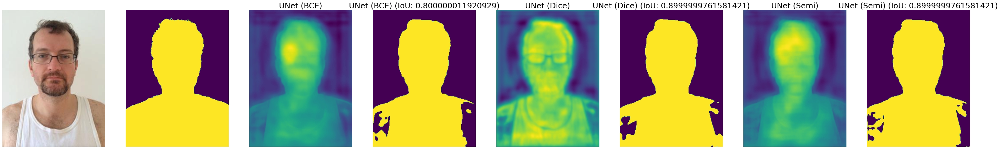

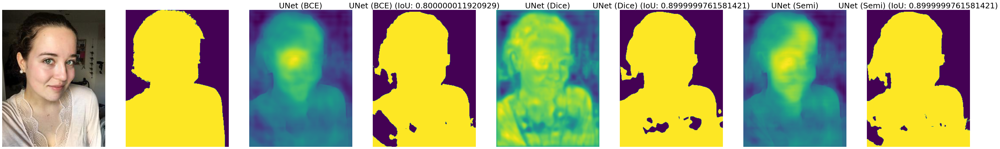

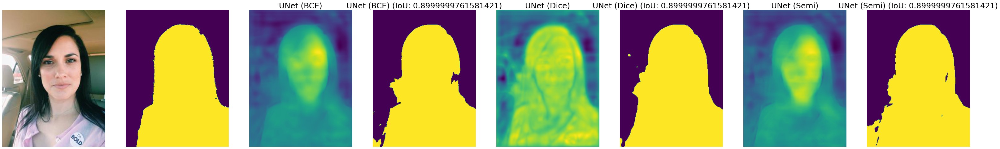

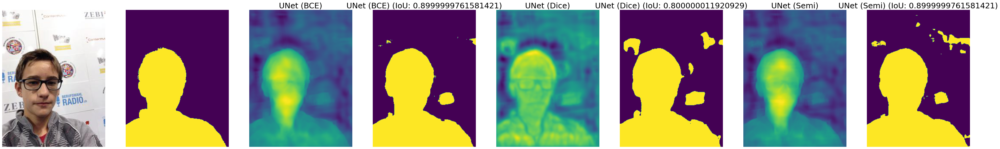

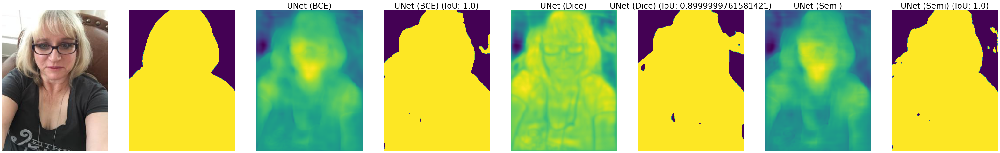

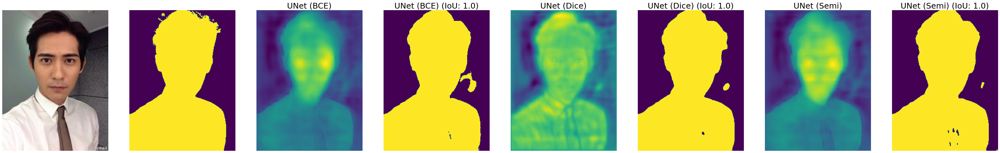

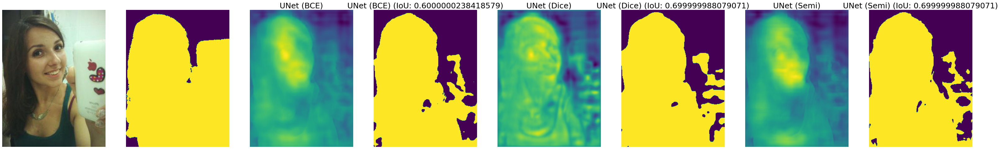

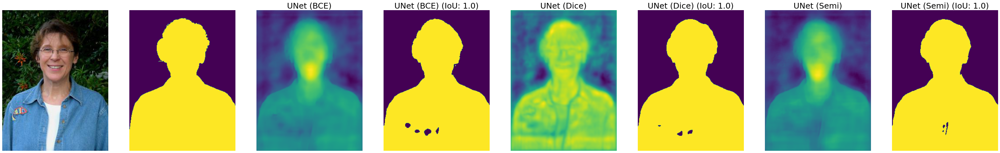

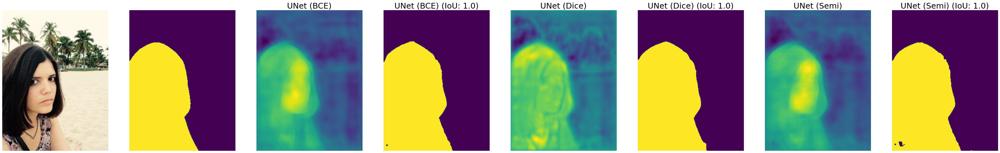

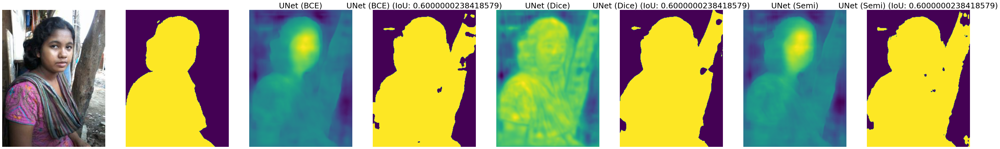

In [104]:
for i in range(10):
    show_diff({'model': ce_model, 'title': 'UNet (BCE)'},
              {'model': d_model, 'title': 'UNet (Dice)'},
              {'model': semi_model, 'title': 'UNet (Semi)'},
              test_dataset=test_dataset, device=device)

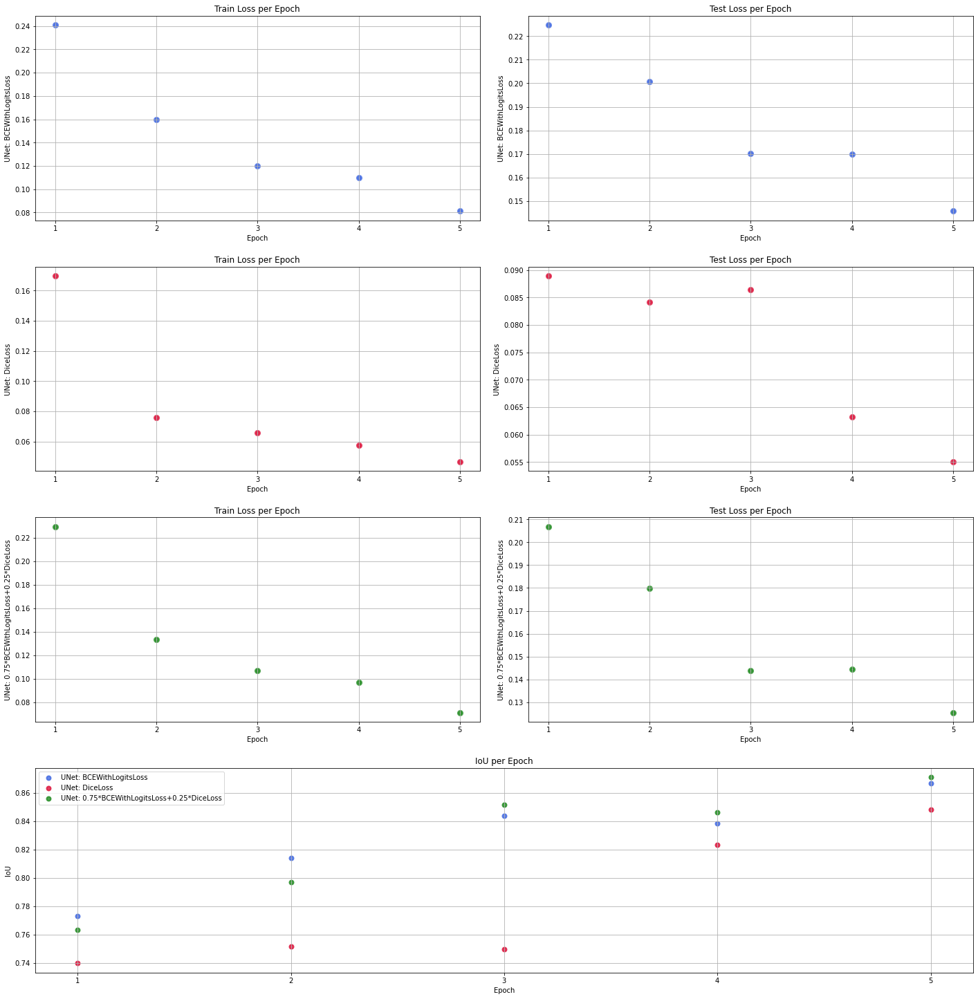

In [35]:
plot_results_single([{'model_name': 'UNet', 'loss_name': 'BCEWithLogitsLoss'}, ce_train_loss, ce_test_loss, ce_iou],
                    [{'model_name': 'UNet', 'loss_name': 'DiceLoss'}, d_train_loss, d_test_loss, d_iou],
                    [{'model_name': 'UNet', 'loss_name': f'{SemiLoss().a}*BCEWithLogitsLoss+{SemiLoss().b}*DiceLoss'},
                     semi_train_loss, semi_test_loss, semi_iou],
                    n_epochs=n_epochs, colors=['royalblue', 'crimson', 'forestgreen', None])

__Выводы:__

* начиная с 3-й эпохи, модель с SemiLoss показывает наилучшее качество 0.871, за ней следует BCE с 0.867, замыкает тройку Dice с 0.848 (сеть только с Dice в целом ведет себя хуже в плане сходимости на 5-и эпохах);  
* применение сети с SemiLoss длится на секунду дольше применения двух других (можно судить по времени применения функции evatuate_net);  
* судя по отрисовываемым маскам, Dice хорошо выделяет границы и подсвечивает все зоны внутри них, BCE хорошо улавливает лицо и общий силуэт - композиция их является хорошей находкой;   
* от запуска к запуску можно было наблюдать проблему датасета: на фоне иногда возникают подсвеченные предметы, по форме напоминающие деревья либо вертикальный узор штор;  

## LinkNet (2 балла)

Реализуйте архитектуру LinkNet с использованием энкодера, основанного на VGG13. Архитектура похожа на Unet, но вместо конкатенации слоёв используются skip-connections. Для реализации достаточно переписать структуру декодировщика из предыдущего пункта.

https://arxiv.org/pdf/1707.03718.pdf

Обучите сеть и проведите анализ согласно предыдущему пункту.

In [105]:
class DecoderBlockLN(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()

        self.upconv = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv1 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv2 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.relu = nn.ReLU()
    def forward(self, down, left):
        x = torch.nn.functional.interpolate(down, scale_factor=2)
        x = self.upconv(x)
        x = self.relu(self.conv1(torch.add(x, left)))
        x = self.relu(self.conv2(x))
        return x

In [106]:
class DecoderLN(nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        for i in range(num_blocks):
            self.add_module(f'block{num_blocks - i}', DecoderBlockLN(num_filters * 2**i))

    def forward(self, acts):
        up = acts[-1]
        for i, left in enumerate(acts[-2::-1]):
            up = self.__getattr__(f'block{i + 1}')(up, left)
        return up

In [107]:
class LinkNet(torch.nn.Module):
    def __init__(self, num_classes=1, num_filters=64, num_blocks=4):
        super().__init__()
        self.encoder = VGG13Encoder(num_blocks=num_blocks)
        self.decoder = DecoderLN(num_filters=64, num_blocks=num_blocks-1)
        self.final = torch.nn.Conv2d(
            in_channels=num_filters, out_channels=num_classes, kernel_size=1
        )

    def forward(self, x):
        acts = self.encoder(x)
        x = self.decoder(acts)
        x = self.final(x)
        return x

Обучите LinkNet. Сравните LinkNet и Unet по качеству и скорости работы. Сделайте выводы. 

__LinkNet: BCE__

In [108]:
ln_ce_model = LinkNet()
criterion = BCEWithLogitsLoss()
optimizer = torch.optim.Adam(ln_ce_model.parameters(), lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=gamma)

In [109]:
ln_ce_train_loss, ln_ce_test_loss, ln_ce_iou = train_net(ln_ce_model, optimizer, scheduler, criterion, path='./ln_ce_model')

 20%|████████████████▌                                                                  | 1/5 [03:13<12:54, 193.58s/it]


Loss for Epoch 1: train -> 0.24531308504251334, test -> 0.24507109577774155, iou -> 0.739007111136795


 40%|█████████████████████████████████▏                                                 | 2/5 [06:22<09:36, 192.17s/it]


Loss for Epoch 2: train -> 0.19588489534013723, test -> 0.20618313381857906, iou -> 0.7950354772256621


 60%|█████████████████████████████████████████████████▊                                 | 3/5 [09:30<06:22, 191.01s/it]


Loss for Epoch 3: train -> 0.1709763545476826, test -> 0.17372638409864818, iou -> 0.8234042614064319


 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [12:39<03:10, 190.20s/it]


Loss for Epoch 4: train -> 0.15598195628125286, test -> 0.17562443440687572, iou -> 0.832624114151542


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [15:47<00:00, 189.48s/it]


Loss for Epoch 5: train -> 0.1418566751960643, test -> 0.14649282321862295, iou -> 0.8673759047866713


In [117]:
%%time
evaluate_net(ln_ce_model, test_data_loader, BCEWithLogitsLoss(), iou, device)

Wall time: 9.6 s


(0.14649282321862295, 0.8673759047866713)

__LinkNet: Dice__

In [111]:
ln_d_model = LinkNet()
criterion = DiceLoss()
optimizer = torch.optim.Adam(ln_d_model.parameters(), lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=gamma)

In [112]:
ln_d_train_loss, ln_d_test_loss, ln_d_iou = train_net(ln_d_model, optimizer, scheduler, criterion, path='./ln_d_model')

 20%|████████████████▌                                                                  | 1/5 [03:09<12:37, 189.41s/it]


Loss for Epoch 1: train -> 0.17622391465147572, test -> 0.0991606665841231, iou -> 0.7063829932652467


 40%|█████████████████████████████████▏                                                 | 2/5 [06:18<09:28, 189.42s/it]


Loss for Epoch 2: train -> 0.12858093103404933, test -> 0.08395924508994353, iou -> 0.7531915015362679


 60%|█████████████████████████████████████████████████▊                                 | 3/5 [09:28<06:18, 189.36s/it]


Loss for Epoch 3: train -> 0.10883498690743182, test -> 0.07655809111628972, iou -> 0.7765957548263225


 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [12:37<03:09, 189.52s/it]


Loss for Epoch 4: train -> 0.09715214345780526, test -> 0.06205297657783995, iou -> 0.8262411381335969


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [15:48<00:00, 189.73s/it]


Loss for Epoch 5: train -> 0.08802431480154484, test -> 0.059051512826419045, iou -> 0.8319149051152223


In [113]:
%%time
evaluate_net(ln_d_model, test_data_loader, DiceLoss(), iou, device)

Wall time: 9.06 s


(0.059051512826419045, 0.8319149051152223)

__LinkNet: 0.75 * BCE + 0.25 * Dice__

In [114]:
ln_semi_model = LinkNet()
criterion = SemiLoss()
optimizer = torch.optim.Adam(ln_semi_model.parameters(), lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma=gamma)

In [115]:
ln_semi_train_loss, ln_semi_test_loss, ln_semi_iou = train_net(ln_semi_model, optimizer, scheduler, criterion, path='./ln_semi_model')

 20%|████████████████▌                                                                  | 1/5 [03:18<13:12, 198.06s/it]


Loss for Epoch 1: train -> 0.2115445754231786, test -> 0.2046486498616266, iou -> 0.7631205734631694


 40%|█████████████████████████████████▏                                                 | 2/5 [06:30<09:48, 196.29s/it]


Loss for Epoch 2: train -> 0.16950584496178572, test -> 0.16249973046864177, iou -> 0.8148936176976413


 60%|█████████████████████████████████████████████████▊                                 | 3/5 [09:44<06:31, 195.58s/it]


Loss for Epoch 3: train -> 0.15100374418132642, test -> 0.1551103672237261, iou -> 0.8354610077878262


 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [12:56<03:14, 194.67s/it]


Loss for Epoch 4: train -> 0.13887618106828464, test -> 0.13475279816498992, iou -> 0.8652482370958261


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [16:10<00:00, 194.17s/it]


Loss for Epoch 5: train -> 0.12660858311288103, test -> 0.12685926628450975, iou -> 0.8695035657138689


In [116]:
%%time
evaluate_net(ln_semi_model, test_data_loader, SemiLoss(), iou, device)

Wall time: 9.55 s


(0.12685926628450975, 0.8695035657138689)

__Results:__

In [145]:
def plot_results_multi(*args, **kwargs):
    n_epochs, colors = kwargs['n_epochs'], kwargs['colors']
    half = len(args) // 2
    size = 1+half
    x = list(range(1, n_epochs+1))
    fig = plt.figure(figsize=(20, 5*size))
    for i in range(half):
        descr0, train_loss0, test_loss0 = args[i][:3]
        descr1, train_loss1, test_loss1 = args[i+half][:3]
        train_plot = plt.subplot(size, 2, 2*i+1)
        plt.scatter(x, train_loss0, linewidths=3, alpha=0.8, c=colors[0],
                    label=f'{descr0["model_name"]}: {descr0["loss_name"]}')
        plt.scatter(x, train_loss1, linewidths=3, alpha=0.8, c=colors[1],
                    label=f'{descr1["model_name"]}: {descr1["loss_name"]}')
        plt.xticks(x)
        plt.title('Train Loss per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(loc='best')
        plt.grid(True)
        
        test_plot = plt.subplot(size, 2, 2*i+2)
        plt.scatter(x, test_loss0, linewidths=3, alpha=0.8, c=colors[0],
                    label=f'{descr0["model_name"]}: {descr0["loss_name"]}')
        plt.scatter(x, test_loss1, linewidths=3, alpha=0.8, c=colors[1],
                    label=f'{descr1["model_name"]}: {descr1["loss_name"]}')
        plt.xticks(x)
        plt.title('Test Loss per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(loc='best')
        plt.grid(True)
        
        plt.tight_layout(pad=2)

    iou_plot = plt.subplot(size, 1, size)
    for i in range(half):
        descr0 = args[i][0]
        ious0 = args[i][3]
        descr1 = args[i+half][0]
        ious1 = args[i+half][3]
        plt.scatter(x, ious0, linewidths=1.2, alpha=0.8,
                    label=f'{descr0["model_name"]}: {descr0["loss_name"]}')
        plt.scatter(x, ious1, linewidths=1.2, alpha=0.8,
                    label=f'{descr1["model_name"]}: {descr1["loss_name"]}')
    plt.title('IoU per Epoch')
    plt.xticks(x)
    plt.xlabel('Epoch')
    plt.ylabel('IoU')
    plt.legend(loc='best')
    plt.grid(True)


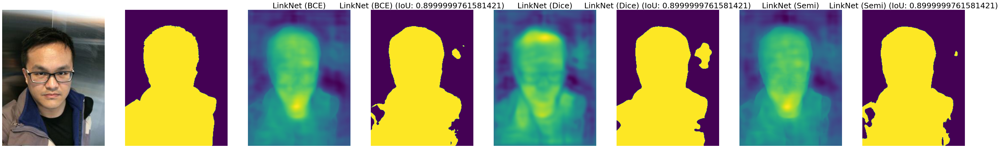

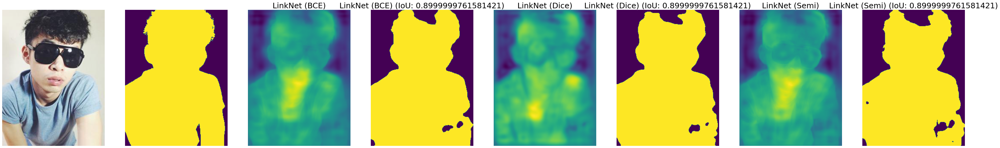

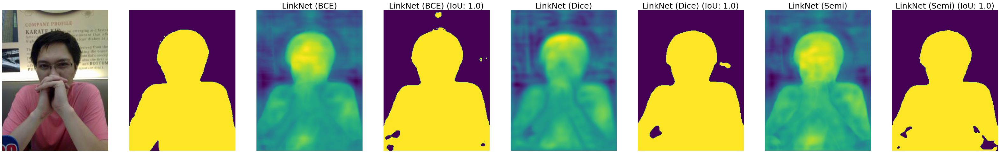

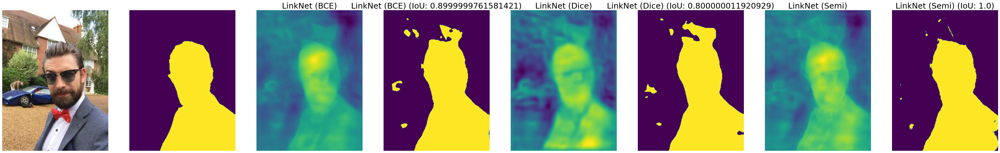

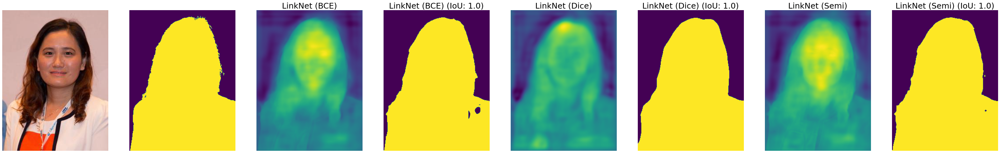

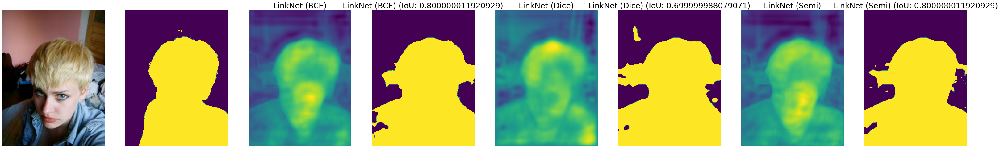

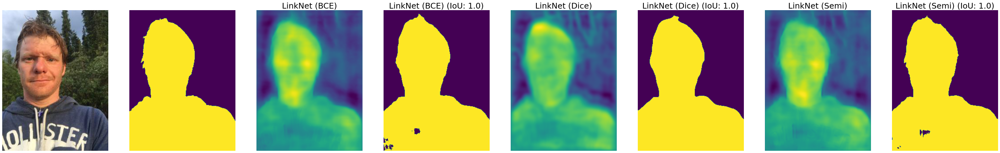

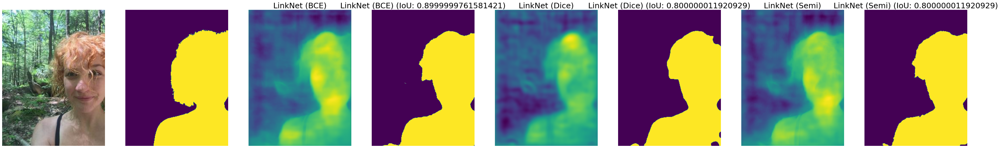

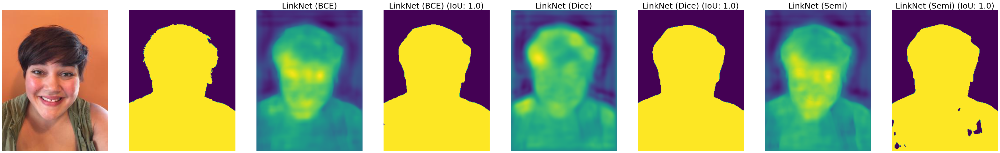

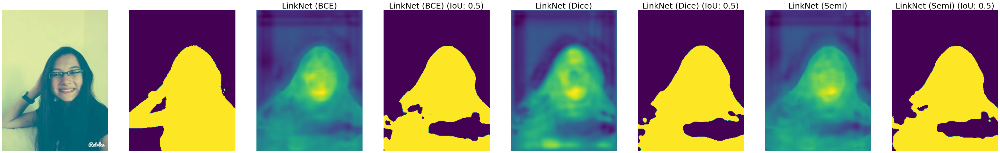

In [147]:
for i in range(10):
    show_diff({'model': ln_ce_model, 'title': 'LinkNet (BCE)'},
              {'model': ln_d_model, 'title': 'LinkNet (Dice)'},
              {'model': ln_semi_model, 'title': 'LinkNet (Semi)'},
              test_dataset=test_dataset, device=device)

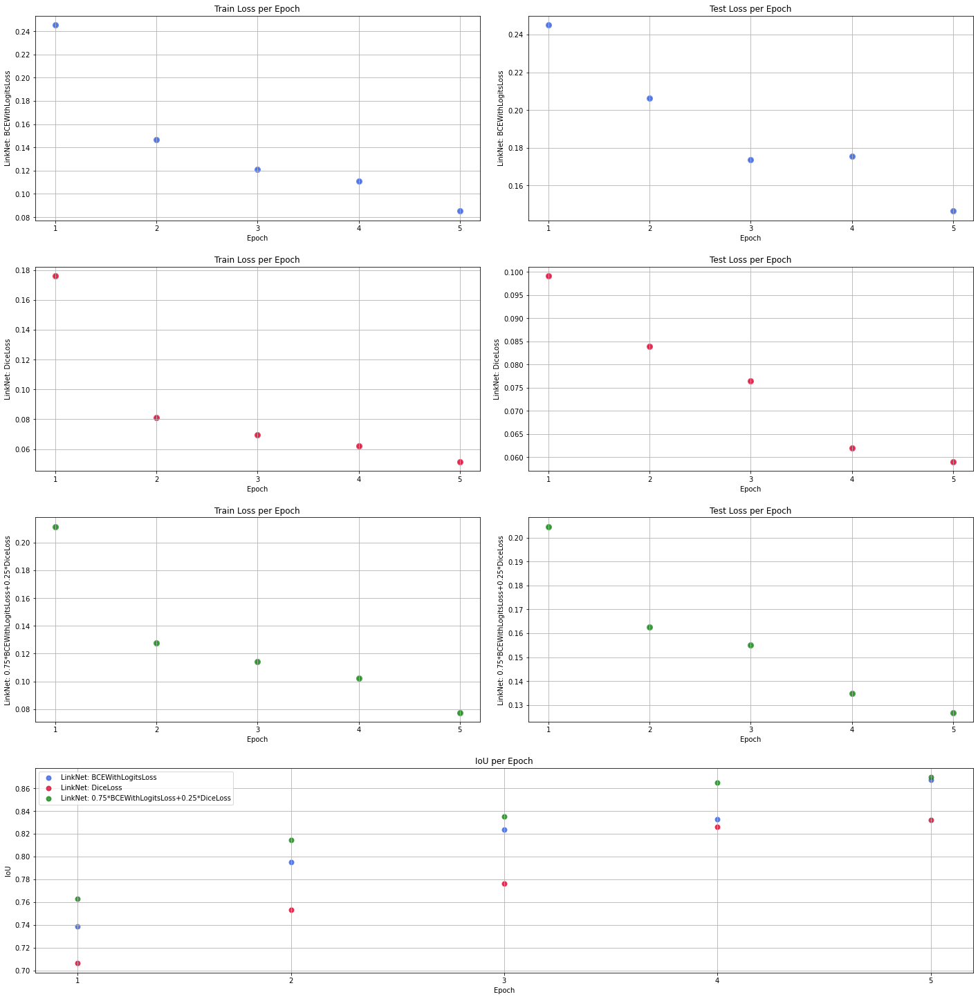

In [149]:
plot_results_single([{'model_name': 'LinkNet', 'loss_name': 'BCEWithLogitsLoss'}, ln_ce_train_loss, ln_ce_test_loss, ln_ce_iou],
                    [{'model_name': 'LinkNet', 'loss_name': 'DiceLoss'}, ln_d_train_loss, ln_d_test_loss, ln_d_iou],
                    [{'model_name': 'LinkNet', 'loss_name': f'{SemiLoss().a}*BCEWithLogitsLoss+{SemiLoss().b}*DiceLoss'},
                     ln_semi_train_loss, ln_semi_test_loss, ln_semi_iou],
                    n_epochs=n_epochs, colors=['royalblue', 'crimson', 'forestgreen', None])

__Выводы:__

* модель с SemiLoss стабильно показывает лучшее качество с итогом 0.870, за ней следует BCE с 0.867, замыкает тройку Dice с 0.832;  
* применение сети с Dice длится на полсекунды быстрее применения двух других (можно судить по времени применения функции evatuate_net);  
* судя по отрисовываемым маскам, Dice и BCE подсвечивают различные важные зоны, свойство выделения второстепенных границ тоже есть - композиция их является хорошей находкой;    

Теперь проведем сравнение LinkNet и UNet.

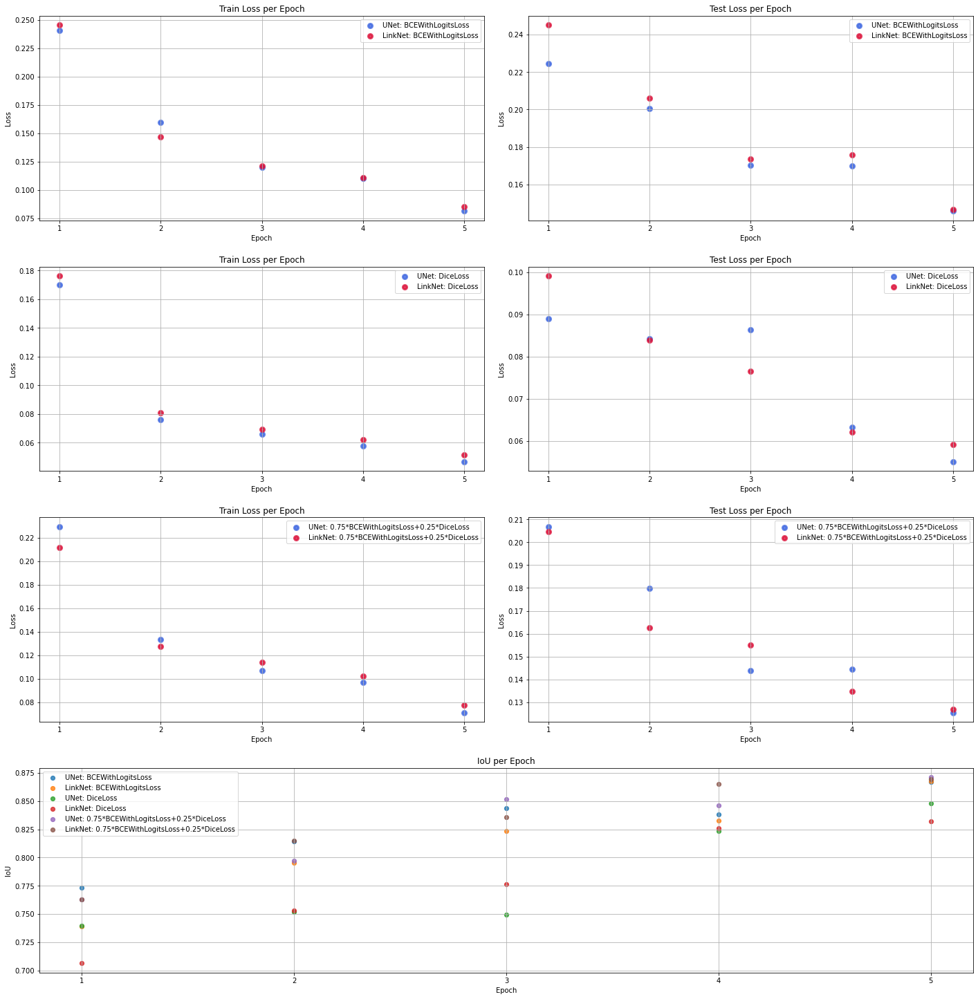

In [146]:
plot_results_multi([{'model_name': 'UNet', 'loss_name': 'BCEWithLogitsLoss'}, ce_train_loss, ce_test_loss, ce_iou],
                   [{'model_name': 'UNet', 'loss_name': 'DiceLoss'}, d_train_loss, d_test_loss, d_iou],
                   [{'model_name': 'UNet', 'loss_name': f'{SemiLoss().a}*BCEWithLogitsLoss+{SemiLoss().b}*DiceLoss'},
                    semi_train_loss, semi_test_loss, semi_iou],
                   [{'model_name': 'LinkNet', 'loss_name': 'BCEWithLogitsLoss'}, ln_ce_train_loss, ln_ce_test_loss, ln_ce_iou],
                   [{'model_name': 'LinkNet', 'loss_name': 'DiceLoss'}, ln_d_train_loss, ln_d_test_loss, ln_d_iou],
                   [{'model_name': 'LinkNet', 'loss_name': f'{SemiLoss().a}*BCEWithLogitsLoss+{SemiLoss().b}*DiceLoss'},
                    ln_semi_train_loss, ln_semi_test_loss, ln_semi_iou],
                   n_epochs=n_epochs, colors=['royalblue', 'crimson'])

На графиках видно, что лучше всего себя показывает модель UNet с SemiLoss, процесс обучения UNet и LinkNet для разных loss примерно идентичен.

Числовые характеристики будем сравнивать при применении функции evaluate_net, ибо относительно двух замеров будет ясна разница в скорости применения, что, в целом, нам и важно (интересно понять, кто быстрее). Соберем их руками в DataFrame.

In [148]:
import pandas as pd

In [164]:
pd.DataFrame.from_dict({'Test BCE Res':[0.146, 0.146], 'Test Dice Res':[0.055,0.060], 'Test Semi Res':[0.126,0.127]}, orient='index', columns=['LinkNet', 'UNet'])

,LinkNet,UNet
Test BCE Res,0.146,0.146
Test Dice Res,0.055,0.060
Test Semi Res,0.126,0.127


In [165]:
pd.DataFrame.from_dict({'Test BCE Time':[10.5, 9.6], 'Test Dice Time':[10.4,9.06], 'Test Semi Time':[11.4,9.55]}, orient='index', columns=['LinkNet', 'UNet'])

,LinkNet,UNet
Test BCE Time,10.5,9.60
Test Dice Time,10.4,9.06
Test Semi Time,11.4,9.55


In [167]:
pd.DataFrame.from_dict({'Test BCE IoU':[0.867, .867], 'Test Dice IoU':[0.848,.832], 'Test Semi IoU':[0.871,0.870]}, orient='index', columns=['LinkNet', 'UNet'])

,LinkNet,UNet
Test BCE IoU,0.867,0.867
Test Dice IoU,0.848,0.832
Test Semi IoU,0.871,0.870


__Общие выводы:__

* UNet Dice больше акцентируется на границах, чем LinkNet Dice;  
* LinkNet с суммированием в decoder работает быстрее UNet с конкатенацией, имеет при этом меньше обучаемых параметров, что позитивно сказывается на скорости применения (стабильно быстрее на секунду, а для лучших моделей с SemiLoss LinkNet вообще быстрее на 2 секунды) при сохранении практически идентичного качества (с точностью до 3-го знака для SemiLoss);  

## Теоретические вопросы (1 балл)

### Вопрос 1.
* Сформулируйте два предположения о структуре входных данных, на которые опирается архитектура сверточных сетей. 
* Какие преимущества дает использование сверток в случае, если эти предположения верные? 
* Приведите пример входных данных, когда эти предположения не выполняются.

* Предположение 1: на картинке присутствуют паттерны, расположенные не локально, а на всем изображении.  
  Предположение 2: пиксели как случайные величины не являются независимыми, а находятся в зависимости от пикселей в некотором окне.

* Ядро свертки состоит из небольшого количества обучаемых параметров, которые позволяют моделировать композиционные зависимости нескольких пикселей в некотором окне, причем эта зависимость будет выстраиваться не только по локальной области картинки, но и по всему изображению.  

* Примером входных данных, для которых эти предположения не выполняется, являются картинки, содержащие несколько разнородных предметов/существ (известный пример: "dog 'nd cherry" из ImageNet, в данном случае паттерны расположены локально (окрас собаки и плоды вишни), про независимость пикселей как случайных величин тут говорить, но если бы, например, размер ягод был бы сопоставим с часто используемыми размерами ядра, то пиксели как случайные величины в окне первого (меньшего размера) и на разности второго (большего размера) и первого окон (если рассматривать окна как множества) являлись бы независимыми при определенных размерах окон).

### Вопрос 2
Пусть дано множество 1-D входов ${x^{(i)} \in \mathbb{R}^{100}}$. 

Рассмотрим полносвязный слой ${f(\cdot)}$, заданный как ${f(x^{(i)}) = \sigma(Wx^{(i)})}$, где ${W}$ - матрица весов размерности ${1000\times 100}$ и ${\sigma(\cdot)}$ поэлементая функция активации. 

Рассмотрим также сверточный слой ${g(\cdot)}$ с десятью картами признаков: ${g(x^{(i)}) = \sigma([z_1, z_2,...,z_{10}])}$, где ${z_j = x^{(i)}\ast w_j}$ для некоторого ядра свертки ${w_j}$ с размером 3 и паддингом 1. Для ${f(\cdot)}$ и ${g(\cdot)}$ напишите: 

1. Размерность выходного пространства. 
2. Количество обучаемых параметров. 
3. Число операций при выполнении forward pass (при условии наивной реализации перемножения матриц и вычисления сверток).

* f (считаем, что bias отсутствует): 

    1) $\mathbb{R}^{1000}$  
    2) 1000 * 100 = 100000  
    3) 1000 * (100 '+' + 99 '*' + 1 * $\sigma$) = 200000

* g: 

    1) $\mathbb{R}^{10 \times 100}$  
    2) 3 * 10 = 30  
    3) 10 * (100 * (3 '*' + 2 '+' + 1 * $\sigma$)) = 6000
